In [1]:
%load_ext autoreload
%autoreload 2

from tqdm.auto import tqdm
import autoreload
from ray.tune.analysis import Analysis
import pandas as pd
import multiprocessing
from ap_rllib.make_video import make_video, parser
import ray
import shutil
from IPython.display import display, FileLink
from matplotlib import pyplot as plt
from ap_rllib_experiment_analysis.analysis_helpers import get_videos, get_scores, concat_videos, VideosDownloader, get_df_from_logdir
import numpy as np
import pickle
from ap_rllib_experiment_analysis.bursts_analysis import burst_background, burst_line_plot, cols, burst_sizes, fill_which_training, iterate_bursts
from ap_rllib.config import get_config_by_name
from os.path import expanduser
import os

pd.set_option('display.max_columns', None)

Instructions for updating:
non-resource variables are not supported in the long term


In [2]:
# need ray for parallel evaluation
ray.shutdown()
ray.init(num_cpus=28, ignore_reinit_error=True, log_to_driver=False)

2020-12-05 08:51:18,875	INFO services.py:1090 -- View the Ray dashboard at http://127.0.0.1:8265


{'node_ip_address': '128.32.175.10',
 'raylet_ip_address': '128.32.175.10',
 'redis_address': '128.32.175.10:6379',
 'object_store_address': '/tmp/ray/session_2020-12-05_08-51-18_338223_57966/sockets/plasma_store',
 'raylet_socket_name': '/tmp/ray/session_2020-12-05_08-51-18_338223_57966/sockets/raylet',
 'webui_url': '127.0.0.1:8265',
 'session_dir': '/tmp/ray/session_2020-12-05_08-51-18_338223_57966',
 'metrics_export_port': 65253,
 'node_id': '516866c20589c766b07905ee183324e8bf847eb5'}

In [3]:
# loading data manually
# for some reason, tune.analysis doesn't work for our trials here
exp_name = "bursts_exp_withnormal_pbt_sb"
config = exp_name # now config==experiment name
config_dict = get_config_by_name(config)

home = expanduser("~")
path = os.path.join(home, 'ray_results', exp_name)
trials = os.listdir(path)
trials = [os.path.join(path, trial) for trial in trials]
trials = sorted(filter(os.path.isdir, trials))

print(f"Got {len(trials)} trials")

Got 13 trials


In [4]:
# loading all trials
trial_to_df = {trial: get_df_from_logdir(trial, do_tqdm=True) for trial in tqdm(trials)}

In [6]:
search_over = ['config/entropy_coeff', 'config/_burst_exponent']

In [7]:
df = pd.DataFrame([trial_to_df[trial].iloc[-1].copy() for trial in trials]).reset_index()
df['logdir'] = trials
[df.drop(c, inplace=True, axis=1) for c in sorted(df.columns) if c.startswith('hist_stats')]
df = df.reindex(sorted(df.columns), axis=1)
df

,checkpoint_rllib,config/_base_dir,config/_burst_exponent,config/_call/checkpoint_freq,config/_call/name,config/_call/num_samples,config/_call/resources_per_trial/custom_resources/tune_cpu,config/_call/stop/timesteps_total,config/_do_not_train_policies,config/_env/SingleAgentToMultiAgent,config/_env/env_name,config/_env/with_video,config/_env_fcn,config/_env_name_rllib,config/_eval_steps,config/_get_policies,config/_log_error,config/_main_filename,config/_model_params/fcnet_activation,config/_model_params/fcnet_hiddens,config/_model_params/fcnet_hiddens_max,config/_model_params/fcnet_hiddens_mean,config/_model_params/fcnet_hiddens_median,config/_model_params/fcnet_hiddens_min,config/_model_params/fcnet_hiddens_std,config/_model_params/free_log_std,config/_model_params/use_lstm,config/_n_adversaries,config/_num_workers_tf,config/_p_normal,config/_policies,config/_policy,config/_postprocess,config/_redis_address,config/_run_inline,config/_select_policy,config/_tmp_dir,config/_train_policies,config/_train_steps,config/_trainer,config/_update_config,config/_update_withpolicies,config/_verbose,config/batch_mode,config/entropy_coeff,config/framework,config/http_remote_port,config/kl_coeff,config/lr,config/num_envs_per_worker,config/num_gpus,config/num_sgd_iter,config/num_workers,config/rollout_fragment_length,config/run_uid,config/sgd_minibatch_size,config/train_batch_size,config/use_gae,date,done,episode_len_mean,episode_reward_max,episode_reward_mean,episode_reward_min,episodes_this_iter,episodes_total,experiment_id,experiment_tag,hostname,index,info/learner/player_1_from_scratch_001/approxkl,info/learner/player_1_from_scratch_001/clipfrac,info/learner/player_1_from_scratch_001/explained_variance,info/learner/player_1_from_scratch_001/fps,info/learner/player_1_from_scratch_001/n_updates,info/learner/player_1_from_scratch_001/policy_entropy,info/learner/player_1_from_scratch_001/policy_loss,info/learner/player_1_from_scratch_001/serial_timesteps,info/learner/player_1_from_scratch_001/time_elapsed,info/learner/player_1_from_scratch_001/total_timesteps,info/learner/player_1_from_scratch_001/value_loss,info/learner/player_1_from_scratch_002/approxkl,info/learner/player_1_from_scratch_002/clipfrac,info/learner/player_1_from_scratch_002/explained_variance,info/learner/player_1_from_scratch_002/fps,info/learner/player_1_from_scratch_002/n_updates,info/learner/player_1_from_scratch_002/policy_entropy,info/learner/player_1_from_scratch_002/policy_loss,info/learner/player_1_from_scratch_002/serial_timesteps,info/learner/player_1_from_scratch_002/time_elapsed,info/learner/player_1_from_scratch_002/total_timesteps,info/learner/player_1_from_scratch_002/value_loss,info/learner/player_1_from_scratch_003/approxkl,info/learner/player_1_from_scratch_003/clipfrac,info/learner/player_1_from_scratch_003/explained_variance,info/learner/player_1_from_scratch_003/fps,info/learner/player_1_from_scratch_003/n_updates,info/learner/player_1_from_scratch_003/policy_entropy,info/learner/player_1_from_scratch_003/policy_loss,info/learner/player_1_from_scratch_003/serial_timesteps,info/learner/player_1_from_scratch_003/time_elapsed,info/learner/player_1_from_scratch_003/total_timesteps,info/learner/player_1_from_scratch_003/value_loss,info/learner/player_1_from_scratch_004/approxkl,info/learner/player_1_from_scratch_004/clipfrac,info/learner/player_1_from_scratch_004/explained_variance,info/learner/player_1_from_scratch_004/fps,info/learner/player_1_from_scratch_004/n_updates,info/learner/player_1_from_scratch_004/policy_entropy,info/learner/player_1_from_scratch_004/policy_loss,info/learner/player_1_from_scratch_004/serial_timesteps,info/learner/player_1_from_scratch_004/time_elapsed,info/learner/player_1_from_scratch_004/total_timesteps,info/learner/player_1_from_scratch_004/value_loss,info/learner/player_1_from_scratch_005/approxkl,info/learner/player_1_from_scratch_005/clipfrac,info/learner/player_1_from_scratch_005/explained_variance,info/learner/player_1_

(array([1., 1., 0., 1., 0., 5., 0., 0., 0., 4.]),
 array([1.15943766e+08, 1.23042232e+08, 1.30140697e+08, 1.37239163e+08,
        1.44337628e+08, 1.51436094e+08, 1.58534560e+08, 1.65633025e+08,
        1.72731491e+08, 1.79829956e+08, 1.86928422e+08]),
 <BarContainer object of 10 artists>)

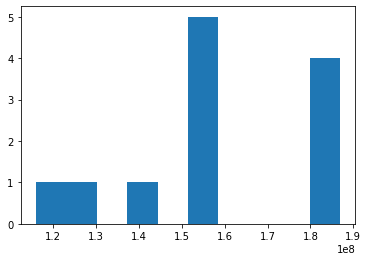

In [8]:
# filtering unfinished trials
df = df[df.timesteps_total > 0.5e8]
plt.hist(df['timesteps_total'])

In [9]:
SCORE_STEPS = 1# 15
VIDEO_STEPS = 1# 15

In [10]:
len(df)

12

In [11]:
df.logdir[0]

'/home/sergei/ray_results/bursts_exp_withnormal_pbt_sb/train_one_with_sacred_0__burst_exponent=1.2805,entropy_coeff=0.011966_2020-11-13_20-41-359z76r6id'

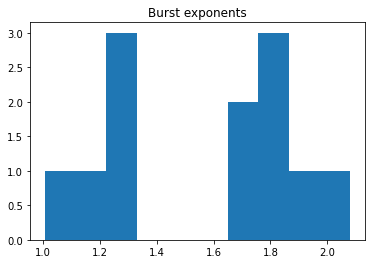

In [12]:
# All exponents
plt.title("Burst exponents")
plt.hist(df['config/_burst_exponent'])
plt.show()

In [23]:
rdf.iloc[-1].checkpoint_rllib

'/home/sergei/ray_results/External_multicomp_2020-11-29_07-06-56r2_o1645/checkpoint_10000/checkpoint-10000'

In [31]:
from IPython.display import FileLink

In [33]:
FileLink(os.path.relpath(videos[0]))

/scratch/sergei/better-adversarial-defenses/ap_rllib_experiment_analysis/notebooks/video-20201205-092329-97b32d86-371e-11eb-85c9-1831bf455a80/video.000000.mp4

In [34]:
def process_trial_dataframe(rdf, fn="experiment"):


    # List of all players
    reward_prefix = 'policy_reward_mean/'
    POLICIES = [x[len(reward_prefix):] for x in rdf.columns if x.startswith(reward_prefix)]
    print("Policies:", POLICIES)

    exponent = rdf['config/_burst_exponent'][0]
    print("Exponent:", exponent)

    # filling the 'which_training' column
    rdf = fill_which_training(rdf, POLICIES)
    burst_sizes_ = burst_sizes(rdf['which_training'])

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Which player is trained?")
    plt.plot(rdf['timesteps_total'], rdf['which_training'])
    plt.xlabel('Timesteps')
    plt.subplot(1, 2, 2)
    plt.title(f"Burst sizes with exponent {round(exponent, 2)}")
    plt.plot(burst_sizes_)
    plt.xlabel('Burst number')
    plt.ylabel('Burst size')
    plt.savefig(fn + "_bursts.png", bbox_inches='tight')
    plt.show()

    plt.figure(figsize=(10, 10))
    plt.xlabel('Timesteps')

    fields = [x for x in rdf.columns if x.startswith(reward_prefix)]

    iterate_bursts(rdf, burst_line_plot, state={'fields': fields,
                                                'colors': {f: cols[i] for i, f in enumerate(fields)},
                                                'rolling': 10},
                   min_size=0)

    plt.legend()
    plt.savefig(fn + "_reward.png", bbox_inches='tight')
    plt.show()

    plt.figure(figsize=(10, 10))
    plt.xlabel('Timesteps')

    fields = [x for x in rdf.columns if x.endswith('value_loss')]

    iterate_bursts(rdf, burst_line_plot, state={'fields': fields,
                                                'colors': {f: cols[i] for i, f in enumerate(fields)},
                                                'rolling': 10},
                   min_size=0)

    plt.legend()
    plt.savefig(fn + "_loss.png", bbox_inches='tight')
    plt.show()


    # was there a switch?
    rdf['switch'] = list(np.array(rdf['which_training'].iloc[1:]) != rdf['which_training'].iloc[:-1]) + [True]

    rdf_e = rdf[rdf['switch'] == 1]
    print("To evaluate", len(rdf_e))

    # obtaining the scores


    scores = get_scores(rdf_e, steps=SCORE_STEPS, load_normal=False, config=config)

    POLICIES_SHOW = list(POLICIES)
    if len(POLICIES_SHOW) == 2:
        POLICIES_SHOW = POLICIES_SHOW[0:1]

    # plotting the win rate
    plt.title("Win rate")
    for p in POLICIES_SHOW:
        plt.plot(rdf_e['timesteps_total'], [x.get(f"wins_policy_{p}_reward", -1) for x in scores], label=p + '_adversarial')
        plt.scatter(rdf_e['timesteps_total'][0], [x.get(f"wins_policy_{p}_reward", -1) for x in scores][0])
        assert all([x.get(f"ties_policy_{p}_reward", 0) == 0 for x in scores])
    plt.xlabel("Time-steps")

    iterate_bursts(rdf, burst_background, state={'min_metric': 0, 'max_metric': 100}, min_size=0)

    plt.legend()
    plt.savefig(fn + "_win_rate.png", bbox_inches='tight')

    plt.show()

    videos = get_videos(rdf_e, steps=VIDEO_STEPS, load_normal=False, config=config)

    result = {'scores': scores, 'videos': videos,
              'xs_e': rdf_e['timesteps_total'],
              'policies': POLICIES,
              'burst_sizes': burst_sizes_,
              'rdf': rdf,
              'rdf_e': rdf_e
             }
    
    return result

In [35]:
trial = df.iloc[0]
rdf = get_df_from_logdir(trial.logdir)

Policies: ['player_1_from_scratch_003', 'player_2_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_002', 'player_1_pretrained', 'player_1_from_scratch_004', 'player_1_from_scratch_001']
Exponent: 1.2804561675554549


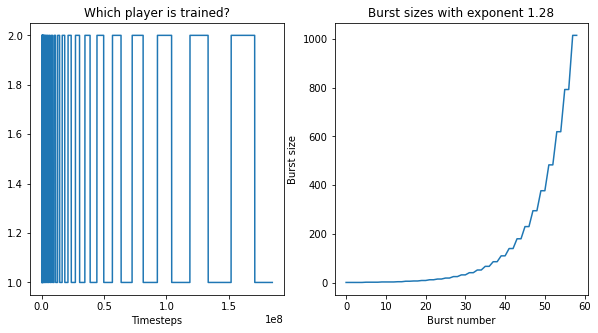

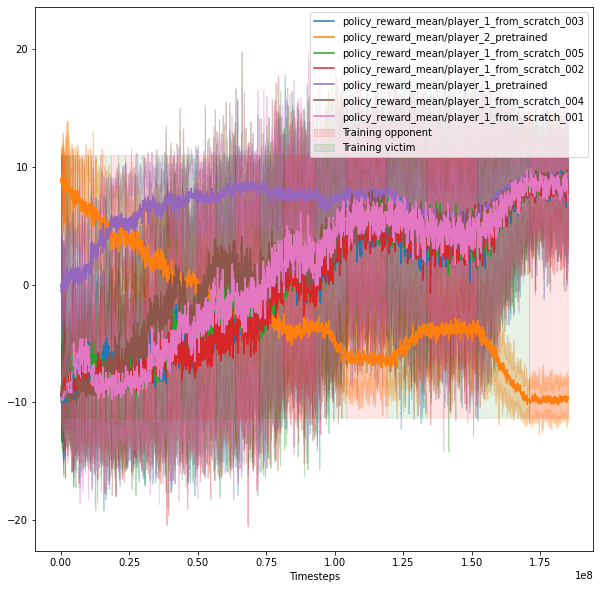

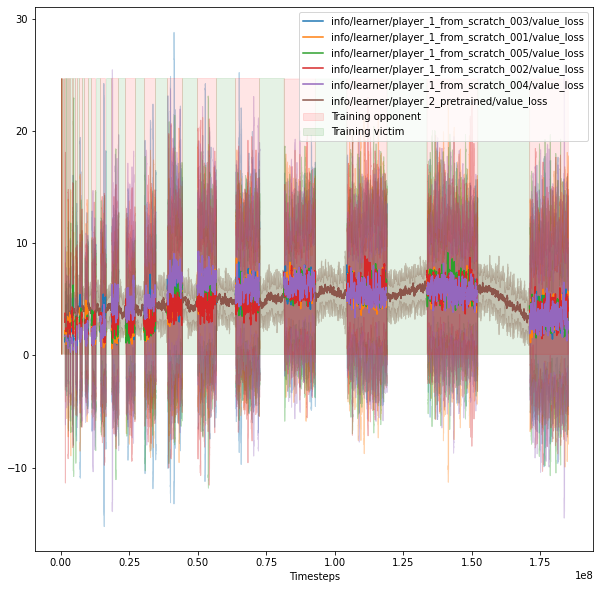

To evaluate 59


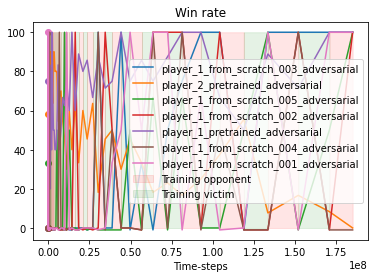

In [36]:
res = process_trial_dataframe(rdf)

In [37]:
SCORE_STEPS = 15
VIDEO_STEPS = 3


Policies: ['player_1_from_scratch_003', 'player_2_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_002', 'player_1_pretrained', 'player_1_from_scratch_004', 'player_1_from_scratch_001']
Exponent: 1.2804561675554549


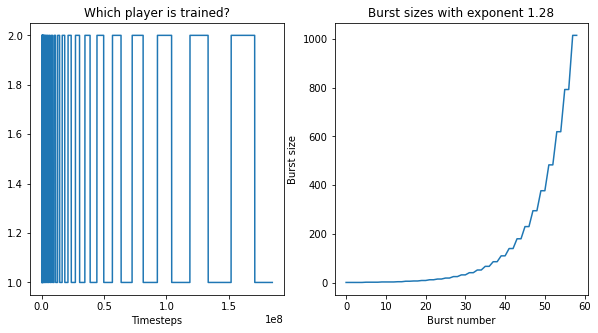

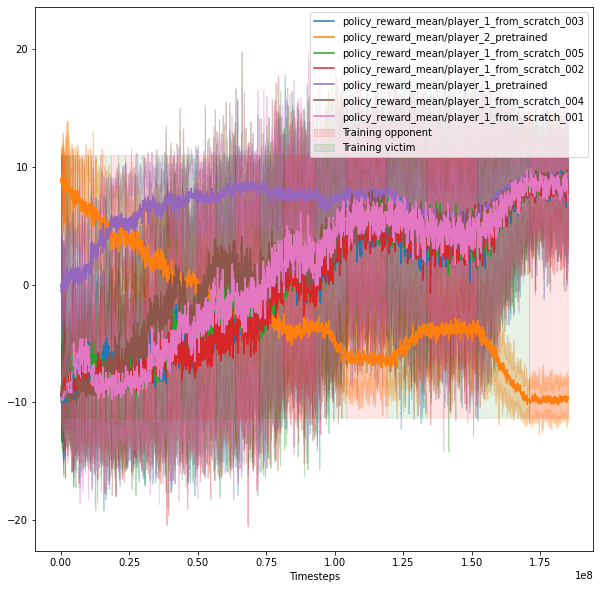

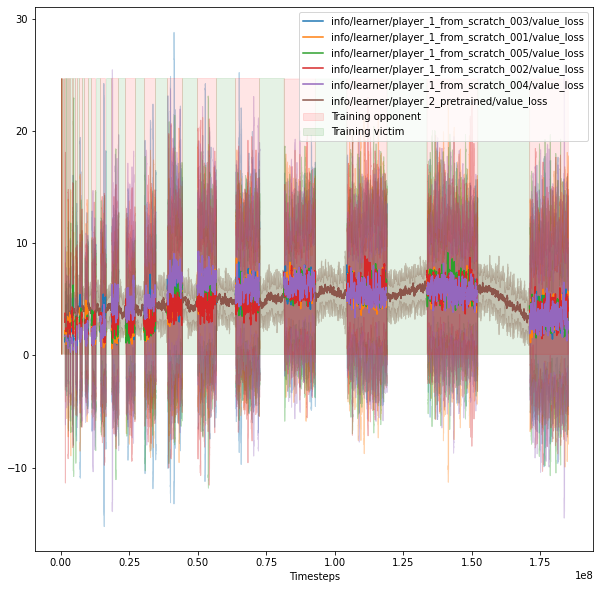

To evaluate 59


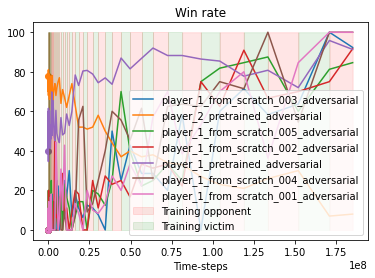


Policies: ['player_1_pretrained', 'player_2_pretrained', 'player_1_from_scratch_001', 'player_1_from_scratch_002', 'player_1_from_scratch_004', 'player_1_from_scratch_003', 'player_1_from_scratch_005']
Exponent: 1.273056985796183


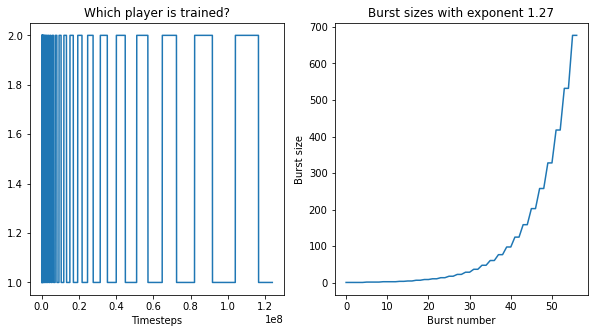

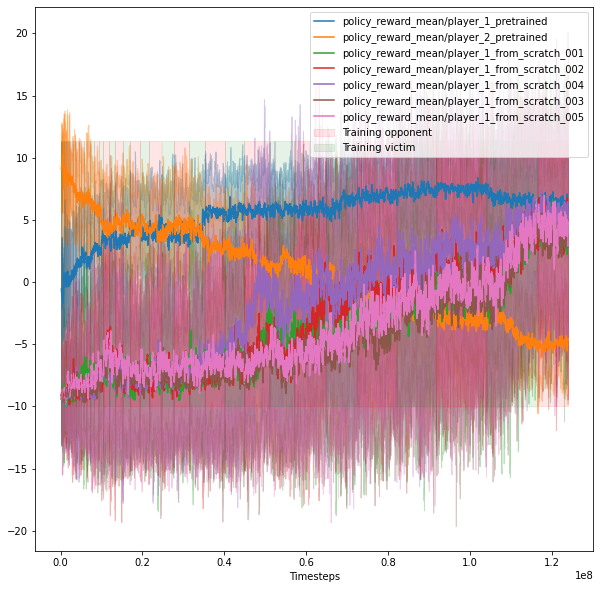

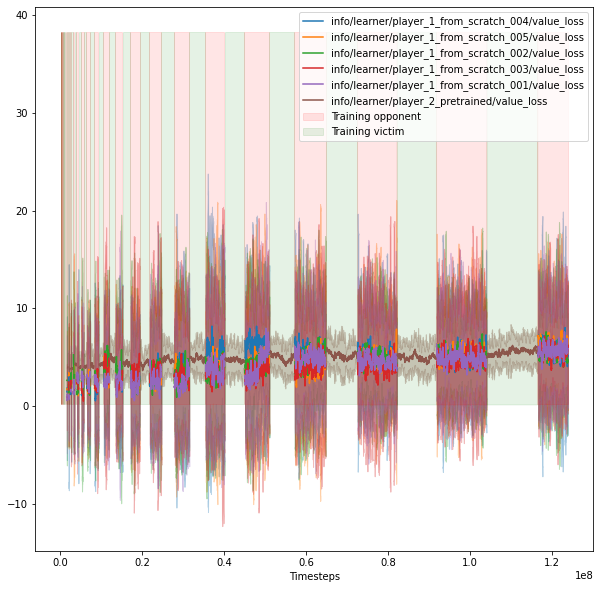

To evaluate 57


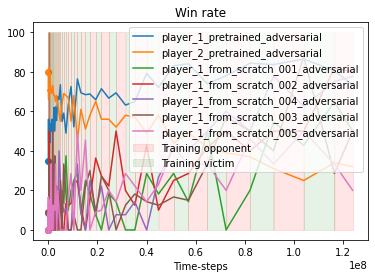


Policies: ['player_1_pretrained', 'player_2_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_004', 'player_1_from_scratch_003', 'player_1_from_scratch_002', 'player_1_from_scratch_001']
Exponent: 1.8370227888932975


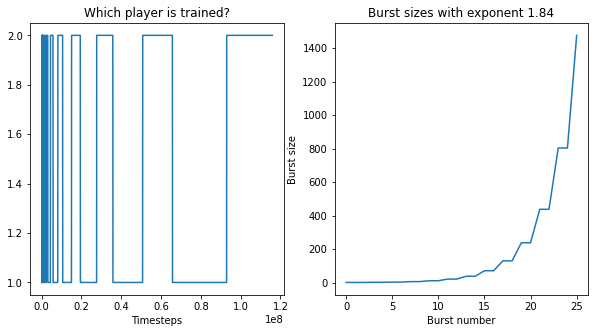

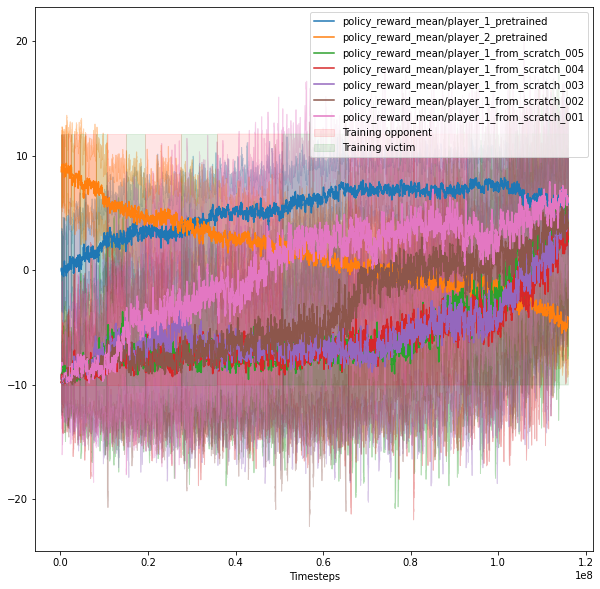

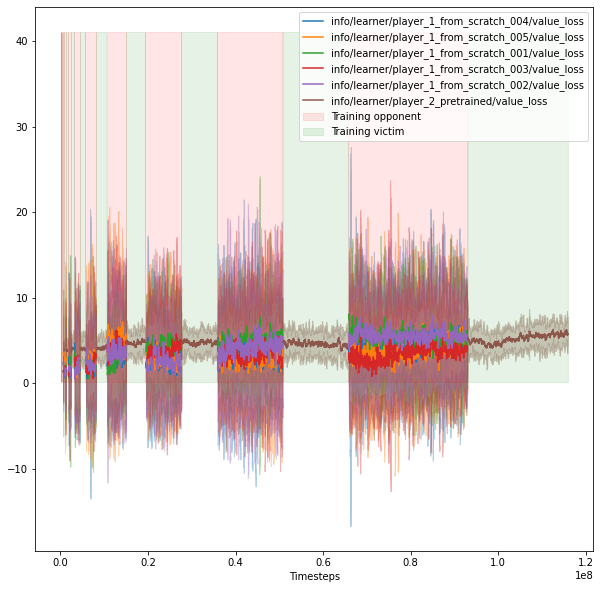

To evaluate 26


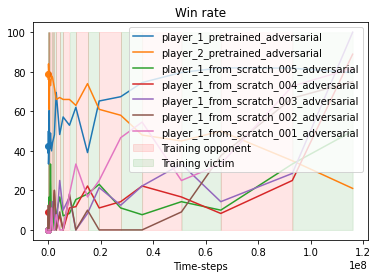


Policies: ['player_1_from_scratch_004', 'player_2_pretrained', 'player_1_from_scratch_002', 'player_1_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_001', 'player_1_from_scratch_003']
Exponent: 1.700013280221449


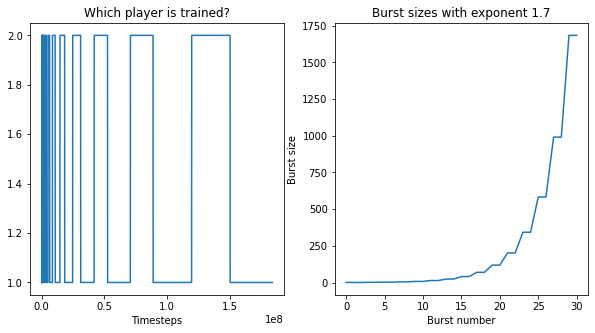

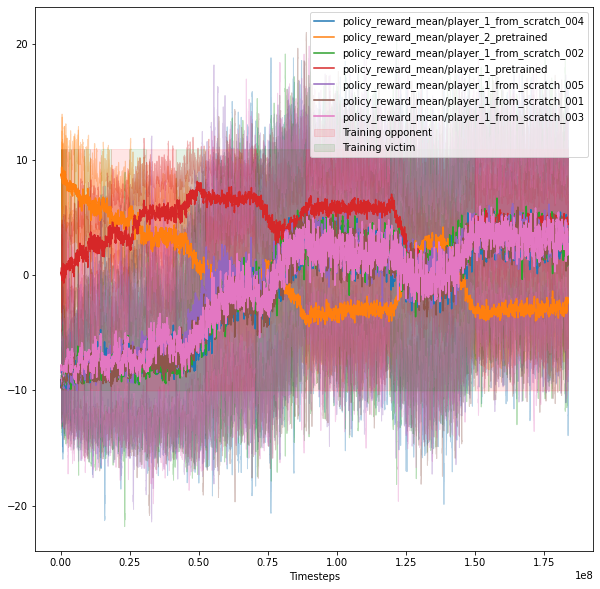

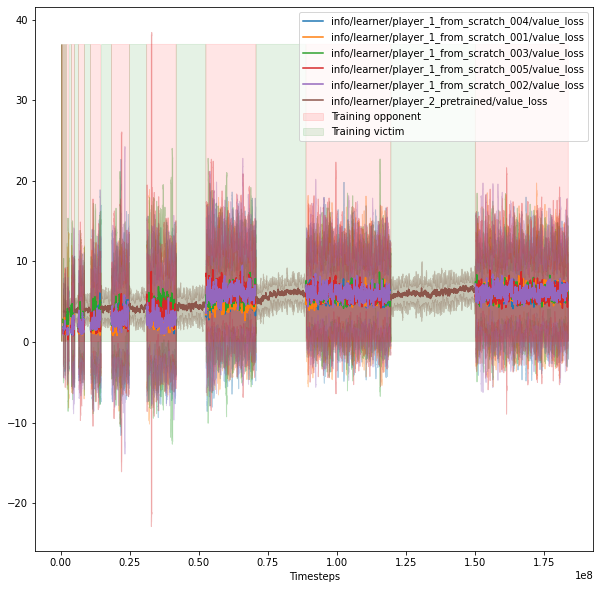

To evaluate 31


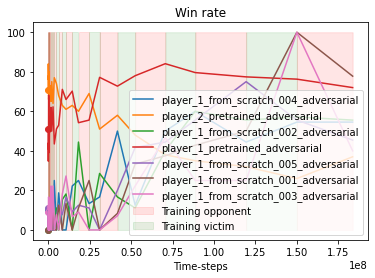


Policies: ['player_1_pretrained', 'player_2_pretrained', 'player_1_from_scratch_001', 'player_1_from_scratch_004', 'player_1_from_scratch_005', 'player_1_from_scratch_003', 'player_1_from_scratch_002']
Exponent: 2.079455644044198


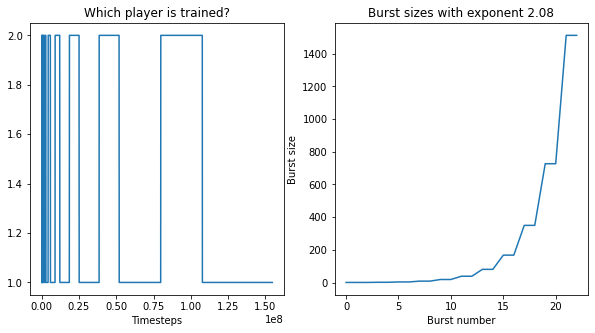

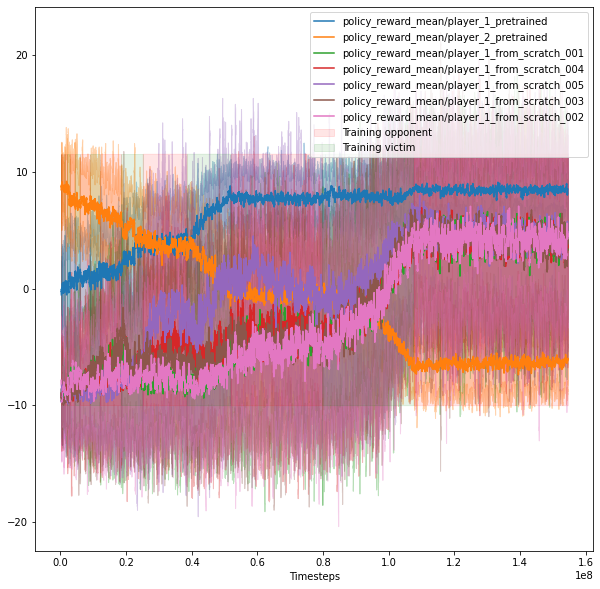

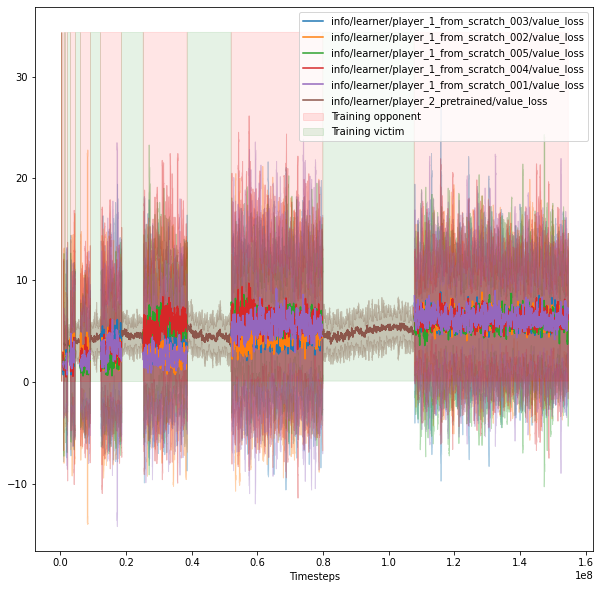

To evaluate 23


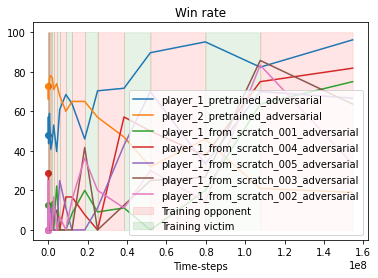


Policies: ['player_1_from_scratch_004', 'player_2_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_002', 'player_1_pretrained', 'player_1_from_scratch_003', 'player_1_from_scratch_001']
Exponent: 1.940262290878727


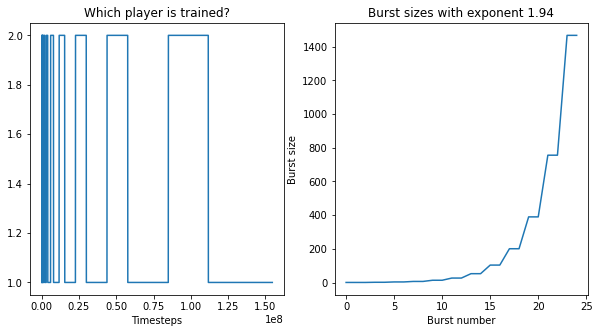

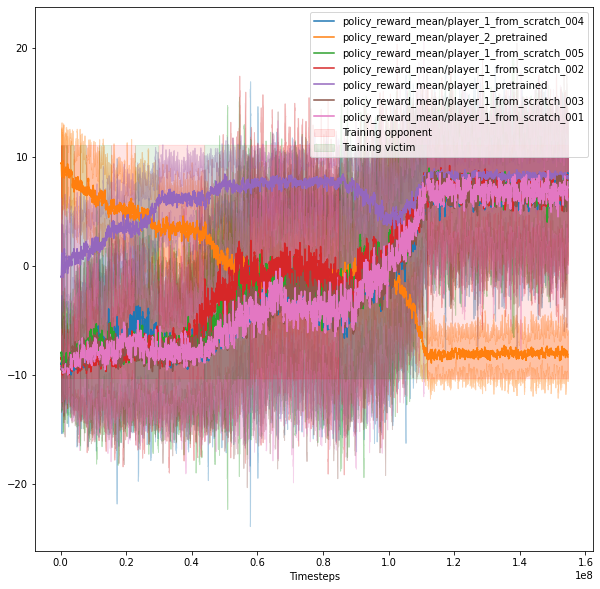

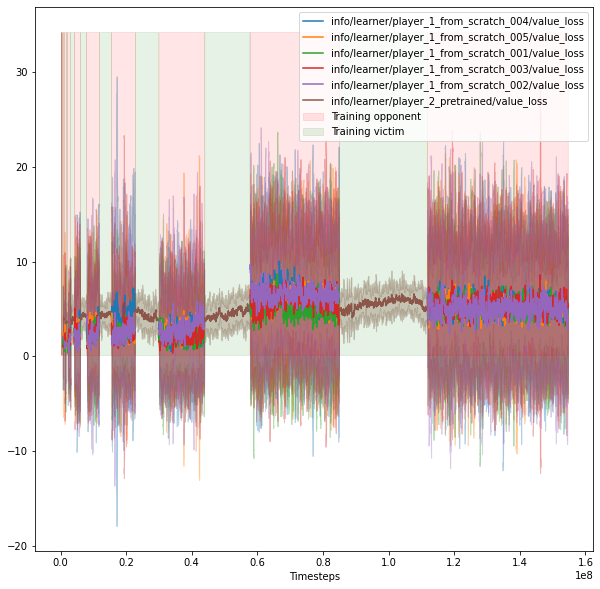

To evaluate 25


2020-12-05 10:42:11,633	WARNING worker.py:1091 -- The actor or task with ID b99baee031f9f506ffffffff01000000 is pending and cannot currently be scheduled. It requires {CPU: 1.000000} for execution and {CPU: 1.000000} for placement, but this node only has remaining {node:128.32.175.10: 1.000000}, {accelerator_type:GTX: 1.000000}, {CPU: 28.000000}, {memory: 143.115234 GiB}, {GPU: 4.000000}, {object_store_memory: 45.068359 GiB}. In total there are 1 pending tasks and 0 pending actors on this node. This is likely due to all cluster resources being claimed by actors. To resolve the issue, consider creating fewer actors or increase the resources available to this Ray cluster. You can ignore this message if this Ray cluster is expected to auto-scale.


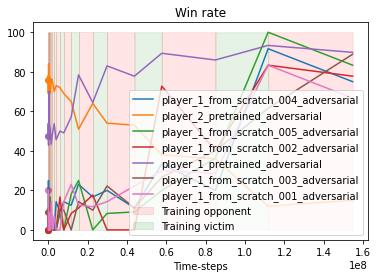


Policies: ['player_1_from_scratch_004', 'player_2_pretrained', 'player_1_from_scratch_005', 'player_1_pretrained', 'player_1_from_scratch_003', 'player_1_from_scratch_002', 'player_1_from_scratch_001']
Exponent: 1.789235301770364


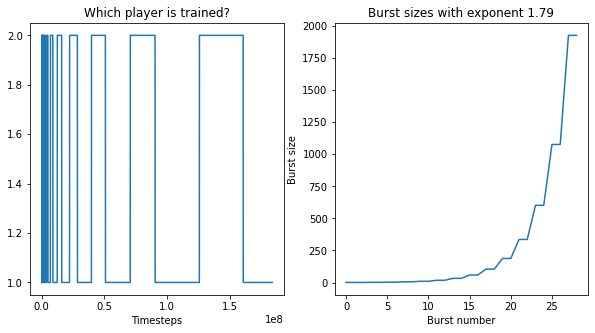

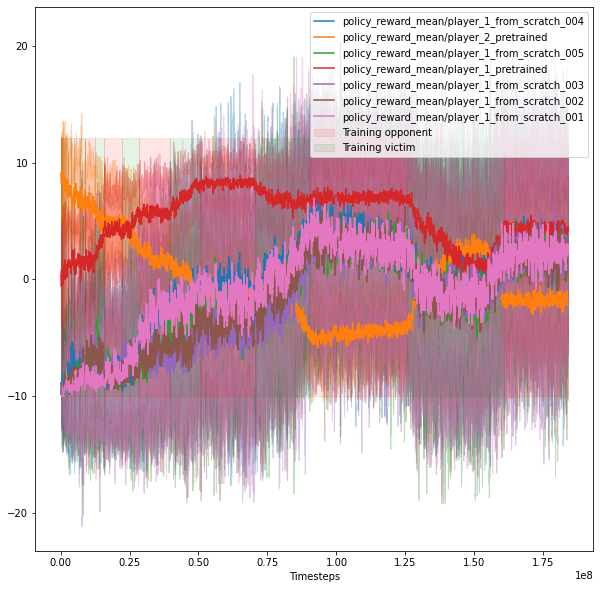

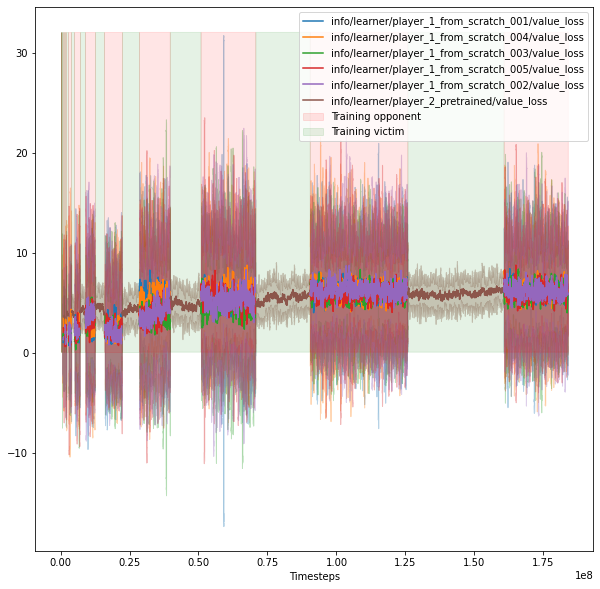

To evaluate 29


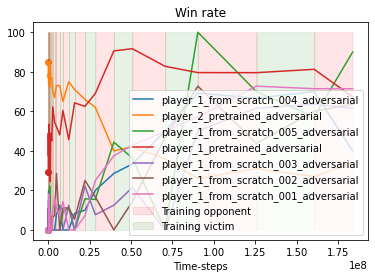


Policies: ['player_1_pretrained', 'player_2_pretrained', 'player_1_from_scratch_004', 'player_1_from_scratch_003', 'player_1_from_scratch_005', 'player_1_from_scratch_001', 'player_1_from_scratch_002']
Exponent: 1.7127899371253452


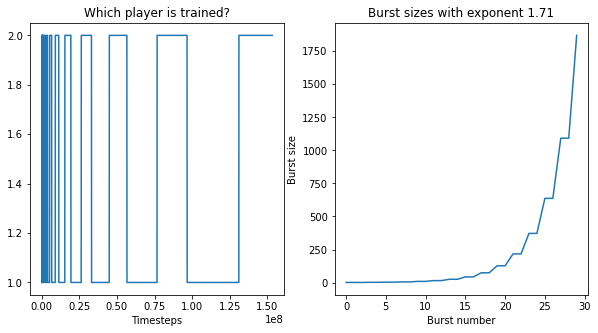

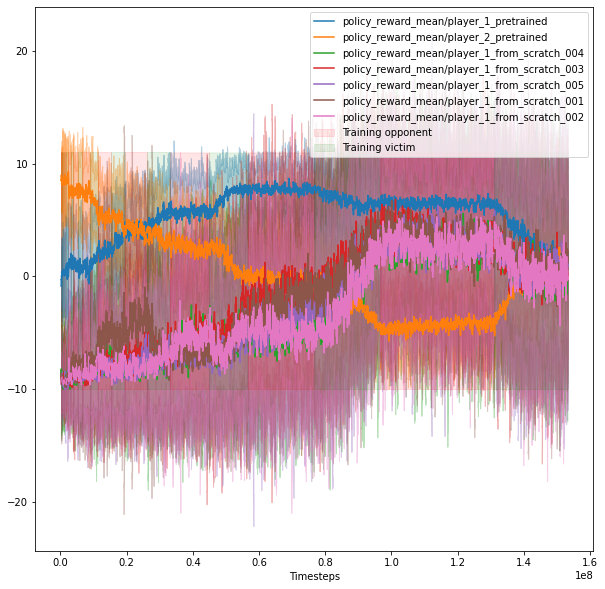

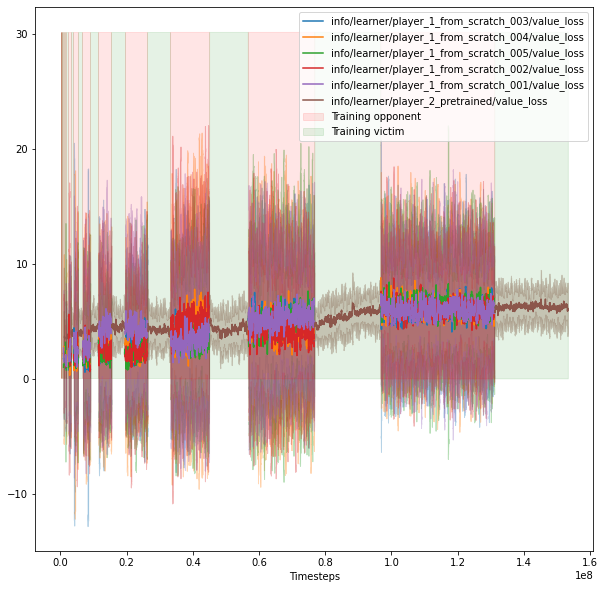

To evaluate 30


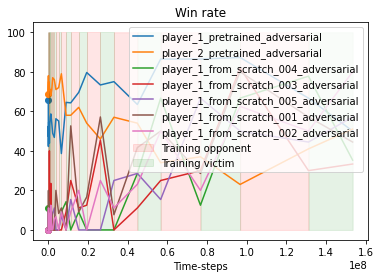


Policies: ['player_1_from_scratch_003', 'player_2_pretrained', 'player_1_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_001', 'player_1_from_scratch_002', 'player_1_from_scratch_004']
Exponent: 1.008223120611671


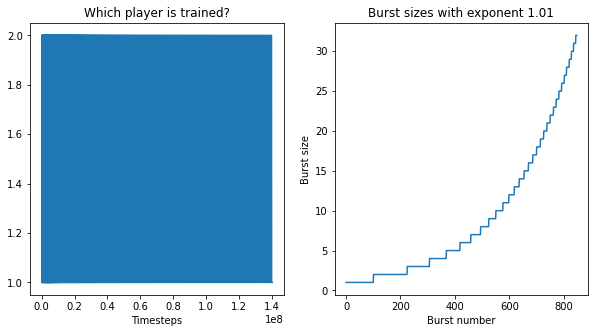

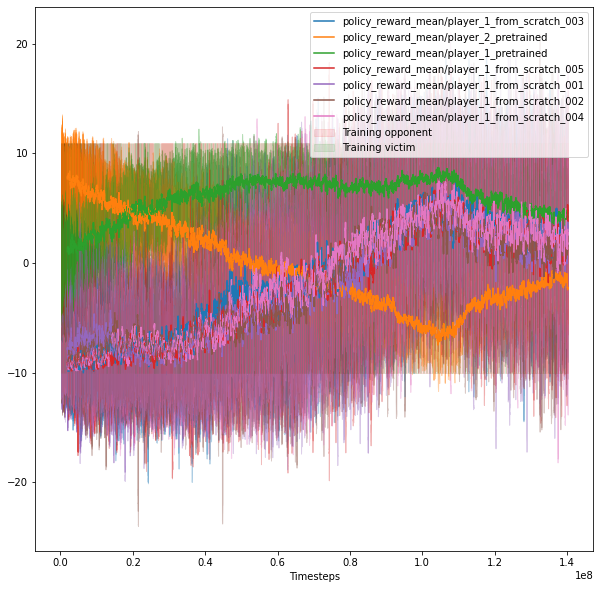

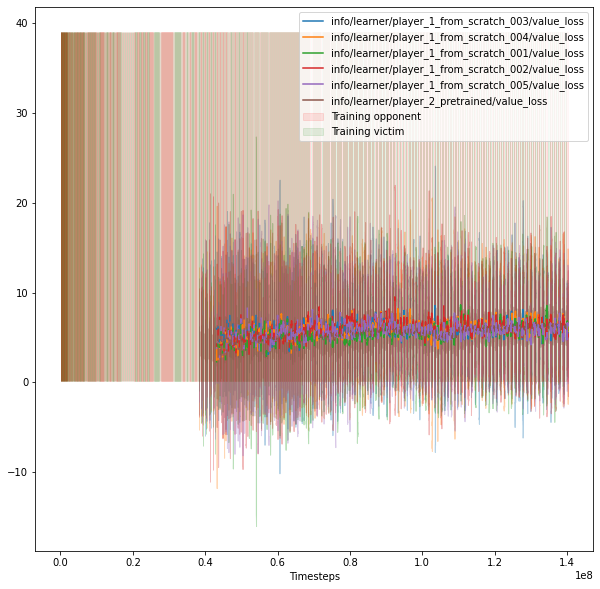

To evaluate 849


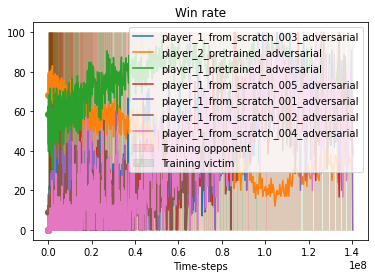


Policies: ['player_1_pretrained', 'player_2_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_001', 'player_1_from_scratch_004', 'player_1_from_scratch_003', 'player_1_from_scratch_002']
Exponent: 1.240018048583848


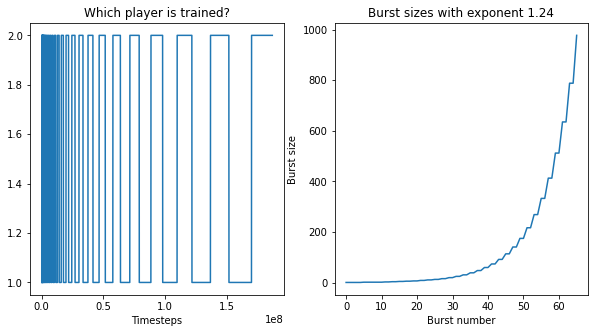

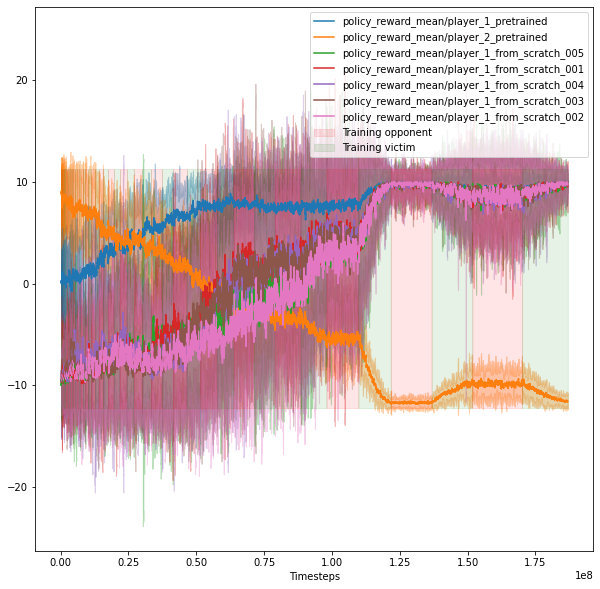

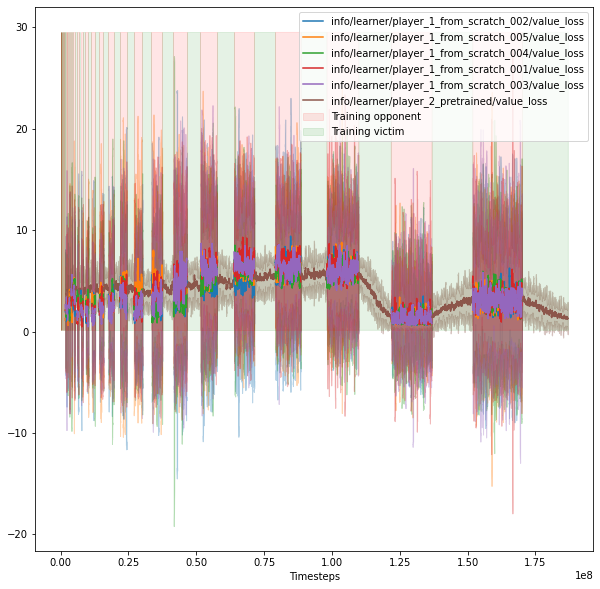

To evaluate 66


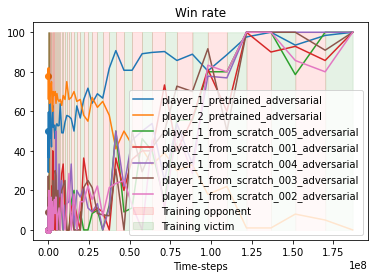


Policies: ['player_1_pretrained', 'player_2_pretrained', 'player_1_from_scratch_004', 'player_1_from_scratch_003', 'player_1_from_scratch_001', 'player_1_from_scratch_005', 'player_1_from_scratch_002']
Exponent: 1.1913796482756507


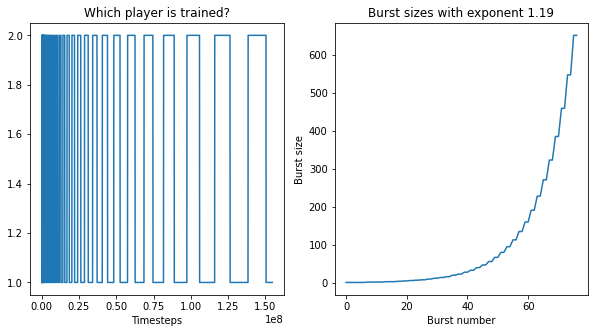

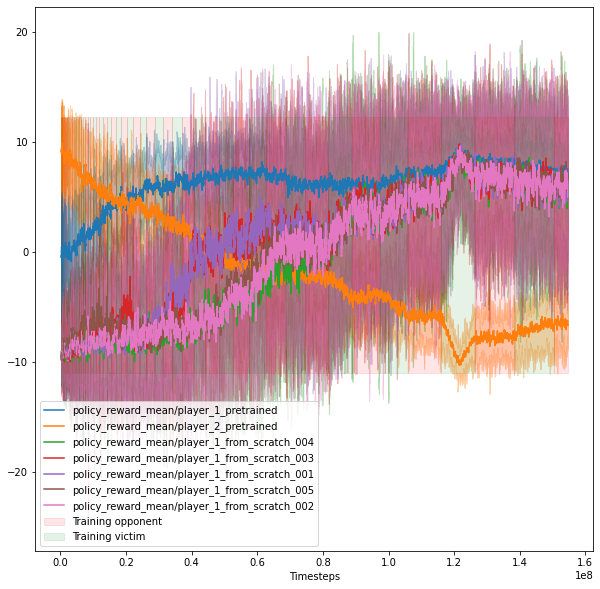

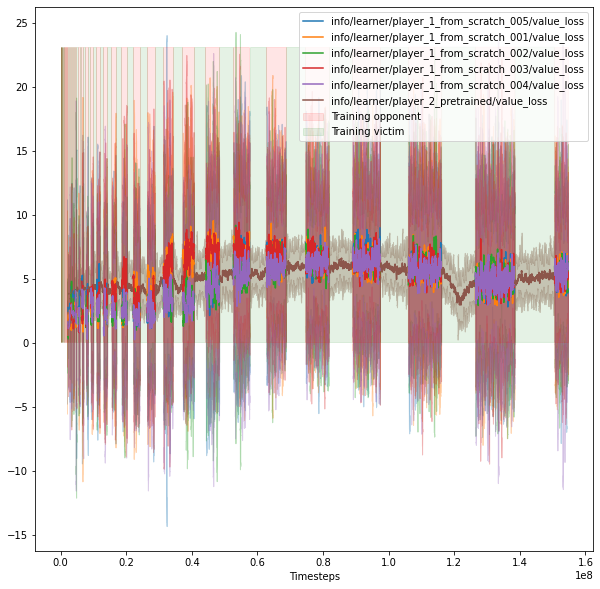

To evaluate 77


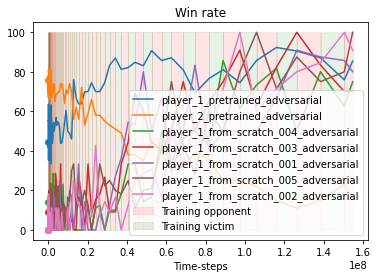


Policies: ['player_1_from_scratch_003', 'player_2_pretrained', 'player_1_pretrained', 'player_1_from_scratch_002', 'player_1_from_scratch_001', 'player_1_from_scratch_004', 'player_1_from_scratch_005']
Exponent: 1.770791351612132


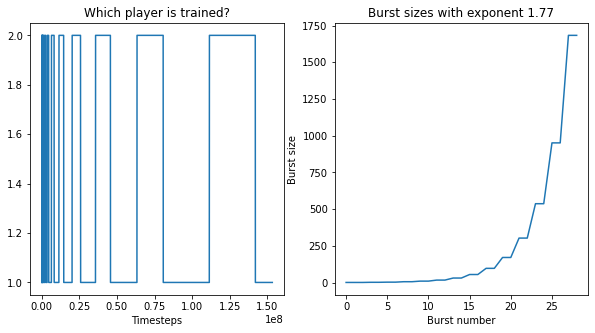

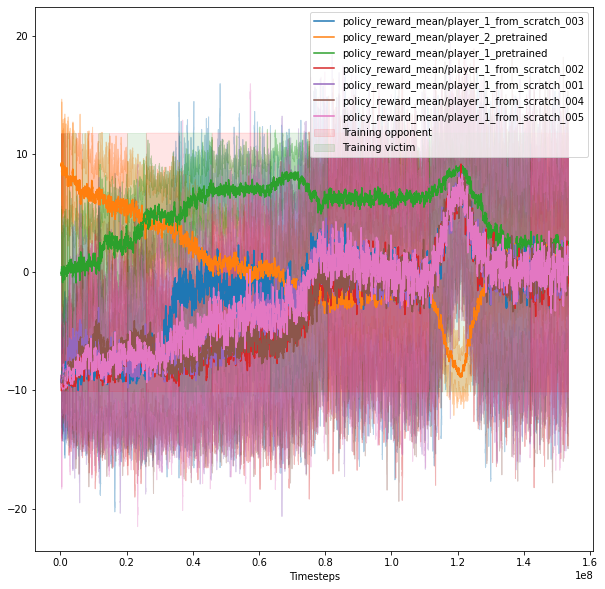

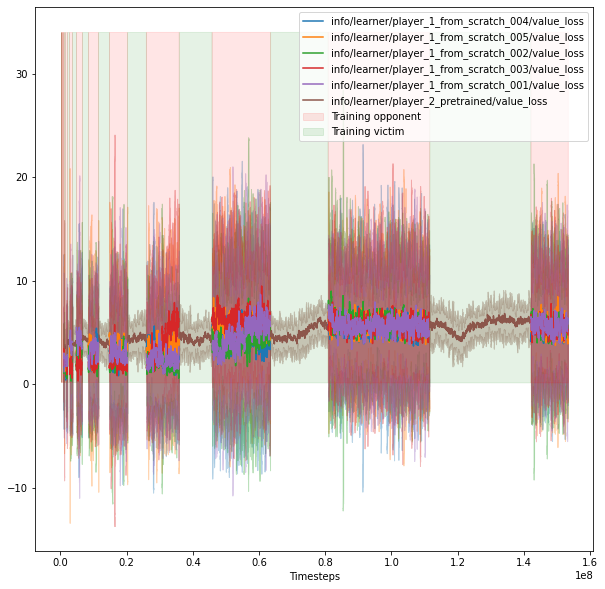

To evaluate 29


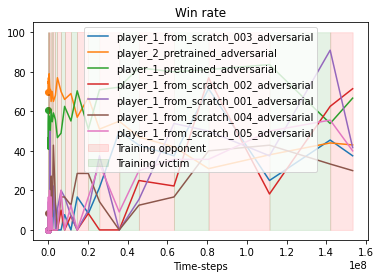

In [38]:
fns = []

for i, trial in df.iterrows():
    rdf = get_df_from_logdir(trial.logdir)
    fn = f"{exp_name}_trial_{str(i)}.pkl"
    res = process_trial_dataframe(rdf, fn)
    
    pickle.dump(res, open(fn, "wb"))
    fns.append(fn)

In [50]:
for i, trial in df.iterrows():
    print(i, trial['trial_id'])

0 ad2b1_00000
2 ad2b1_00011
3 ad2b1_00012
4 ad2b1_00001
5 ad2b1_00002
6 ad2b1_00003
7 ad2b1_00004
8 ad2b1_00005
9 ad2b1_00006
10 ad2b1_00007
11 ad2b1_00008
12 ad2b1_00009


In [39]:
from tqdm import tqdm

In [40]:
with VideosDownloader() as vd:

    for i, trial in tqdm(df.iterrows()):
        fn = f"{exp_name}_trial_{str(i)}.pkl"
        res = pickle.load(open(fn, "rb"))

        if 'videos_normal' in res:
            for j, video in enumerate(res['videos_normal']):
                vd.add_video(video, "trial_normal_%05d_ts_%09d.mp4" % (i, res['rdf_e'].timesteps_total.iloc[j]))

        if 'videos' in res:
            for j, video in enumerate(res['videos']):
                vd.add_video(video, "trial_advers_%05d_ts_%09d.mp4" % (i, res['rdf_e'].timesteps_total.iloc[j]))

12it [00:12,  1.04s/it]


/scratch/sergei/better-adversarial-defenses/ap_rllib_experiment_analysis/notebooks/videos.zip

Policies: ['player_1_from_scratch_003', 'player_2_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_002', 'player_1_pretrained', 'player_1_from_scratch_004', 'player_1_from_scratch_001']
Exponent: 1.2804561675554549
Policies: ['player_1_pretrained', 'player_2_pretrained', 'player_1_from_scratch_001', 'player_1_from_scratch_002', 'player_1_from_scratch_004', 'player_1_from_scratch_003', 'player_1_from_scratch_005']
Exponent: 1.273056985796183


<ipython-input-41-b1e6f0fd8748>:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 1)
<ipython-input-41-b1e6f0fd8748>:23: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 2)


Policies: ['player_1_pretrained', 'player_2_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_004', 'player_1_from_scratch_003', 'player_1_from_scratch_002', 'player_1_from_scratch_001']
Exponent: 1.8370227888932975


<ipython-input-41-b1e6f0fd8748>:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 1)
<ipython-input-41-b1e6f0fd8748>:23: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 2)


Policies: ['player_1_from_scratch_004', 'player_2_pretrained', 'player_1_from_scratch_002', 'player_1_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_001', 'player_1_from_scratch_003']
Exponent: 1.700013280221449


<ipython-input-41-b1e6f0fd8748>:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 1)
<ipython-input-41-b1e6f0fd8748>:23: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 2)


Policies: ['player_1_pretrained', 'player_2_pretrained', 'player_1_from_scratch_001', 'player_1_from_scratch_004', 'player_1_from_scratch_005', 'player_1_from_scratch_003', 'player_1_from_scratch_002']
Exponent: 2.079455644044198


<ipython-input-41-b1e6f0fd8748>:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 1)
<ipython-input-41-b1e6f0fd8748>:23: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 2)


Policies: ['player_1_from_scratch_004', 'player_2_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_002', 'player_1_pretrained', 'player_1_from_scratch_003', 'player_1_from_scratch_001']
Exponent: 1.940262290878727


<ipython-input-41-b1e6f0fd8748>:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 1)
<ipython-input-41-b1e6f0fd8748>:23: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 2)


Policies: ['player_1_from_scratch_004', 'player_2_pretrained', 'player_1_from_scratch_005', 'player_1_pretrained', 'player_1_from_scratch_003', 'player_1_from_scratch_002', 'player_1_from_scratch_001']
Exponent: 1.789235301770364


<ipython-input-41-b1e6f0fd8748>:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 1)
<ipython-input-41-b1e6f0fd8748>:23: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 2)


Policies: ['player_1_pretrained', 'player_2_pretrained', 'player_1_from_scratch_004', 'player_1_from_scratch_003', 'player_1_from_scratch_005', 'player_1_from_scratch_001', 'player_1_from_scratch_002']
Exponent: 1.7127899371253452


<ipython-input-41-b1e6f0fd8748>:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 1)
<ipython-input-41-b1e6f0fd8748>:23: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 2)


Policies: ['player_1_from_scratch_003', 'player_2_pretrained', 'player_1_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_001', 'player_1_from_scratch_002', 'player_1_from_scratch_004']
Exponent: 1.008223120611671


<ipython-input-41-b1e6f0fd8748>:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 1)
<ipython-input-41-b1e6f0fd8748>:23: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 2)


Policies: ['player_1_pretrained', 'player_2_pretrained', 'player_1_from_scratch_005', 'player_1_from_scratch_001', 'player_1_from_scratch_004', 'player_1_from_scratch_003', 'player_1_from_scratch_002']
Exponent: 1.240018048583848


<ipython-input-41-b1e6f0fd8748>:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 1)
<ipython-input-41-b1e6f0fd8748>:23: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 2)


Policies: ['player_1_pretrained', 'player_2_pretrained', 'player_1_from_scratch_004', 'player_1_from_scratch_003', 'player_1_from_scratch_001', 'player_1_from_scratch_005', 'player_1_from_scratch_002']
Exponent: 1.1913796482756507


<ipython-input-41-b1e6f0fd8748>:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 1)
<ipython-input-41-b1e6f0fd8748>:23: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 2)


Policies: ['player_1_from_scratch_003', 'player_2_pretrained', 'player_1_pretrained', 'player_1_from_scratch_002', 'player_1_from_scratch_001', 'player_1_from_scratch_004', 'player_1_from_scratch_005']
Exponent: 1.770791351612132


<ipython-input-41-b1e6f0fd8748>:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 1)
<ipython-input-41-b1e6f0fd8748>:23: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(1, 2, 2)


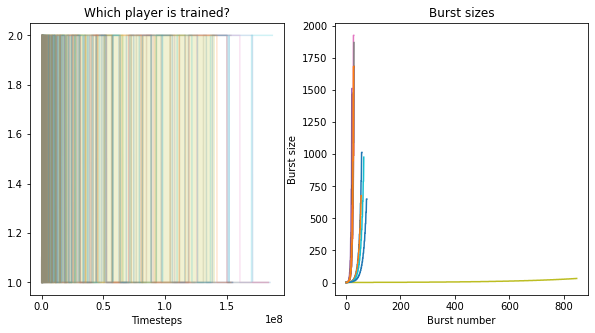

In [41]:
plt.figure(figsize=(10, 5))
for i, trial in df.iterrows():
    fn = f"{exp_name}_trial_{str(i)}.pkl"
    res = pickle.load(open(fn, "rb"))
    rdf = res['rdf']
    
    # List of all players
    reward_prefix = 'policy_reward_mean/'
    POLICIES = [x[len(reward_prefix):] for x in rdf.columns if x.startswith(reward_prefix)]
    print("Policies:", POLICIES)

    exponent = rdf['config/_burst_exponent'][0]
    print("Exponent:", exponent)

    # filling the 'which_training' column
    rdf = fill_which_training(rdf, POLICIES)
    burst_sizes_ = burst_sizes(rdf['which_training'])
    
    plt.subplot(1, 2, 1)
    plt.title("Which player is trained?")
    plt.plot(rdf['timesteps_total'], rdf['which_training'], alpha=0.2)
    plt.xlabel('Timesteps')
    plt.subplot(1, 2, 2)
    plt.title(f"Burst sizes")
    plt.plot(burst_sizes_)
    plt.xlabel('Burst number')
    plt.ylabel('Burst size')
plt.show()

To evaluate 59


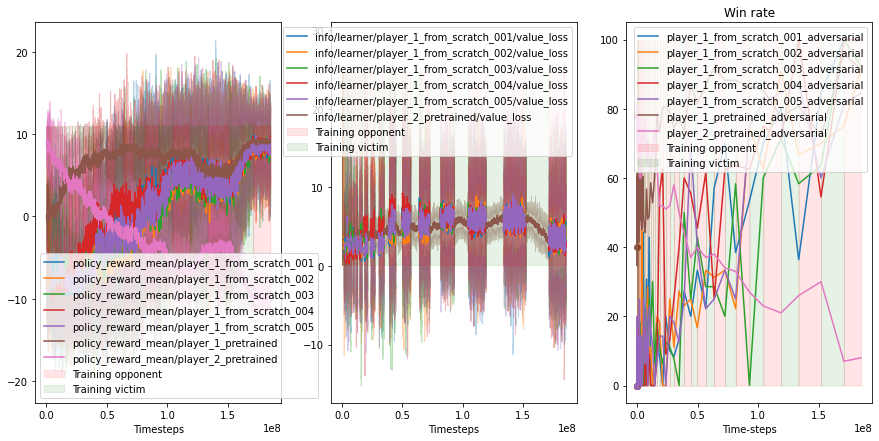

To evaluate 57


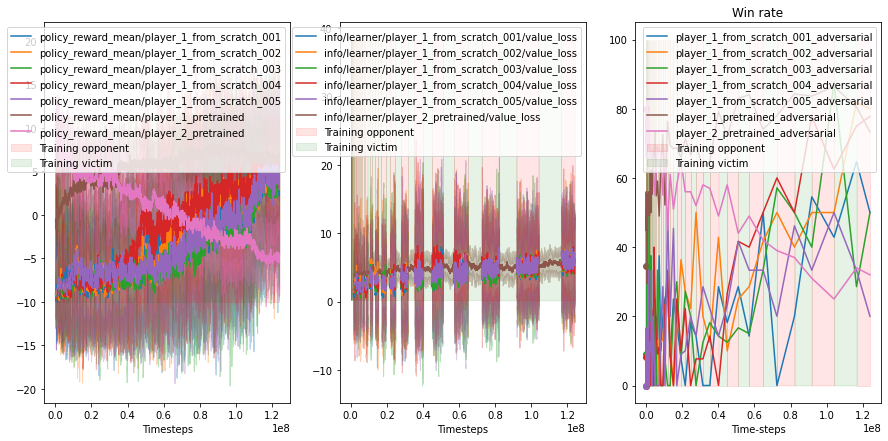

To evaluate 26


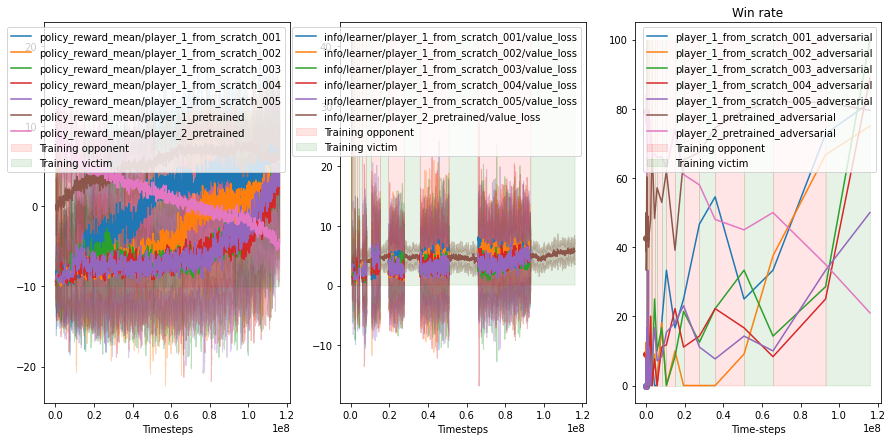

To evaluate 31


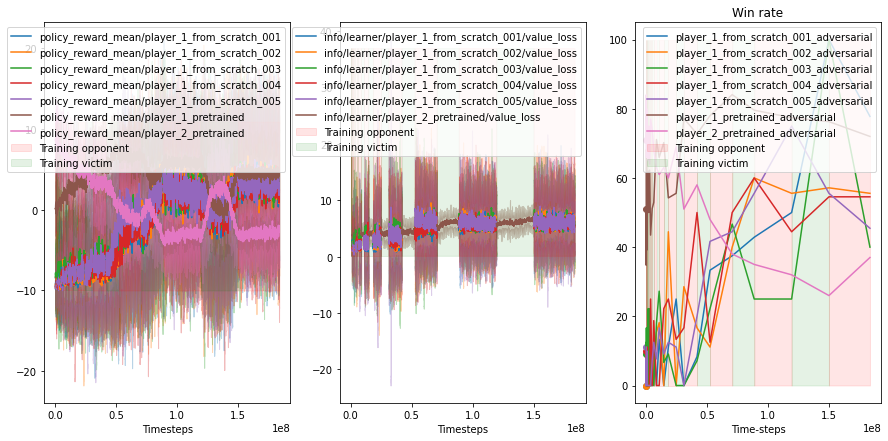

To evaluate 23


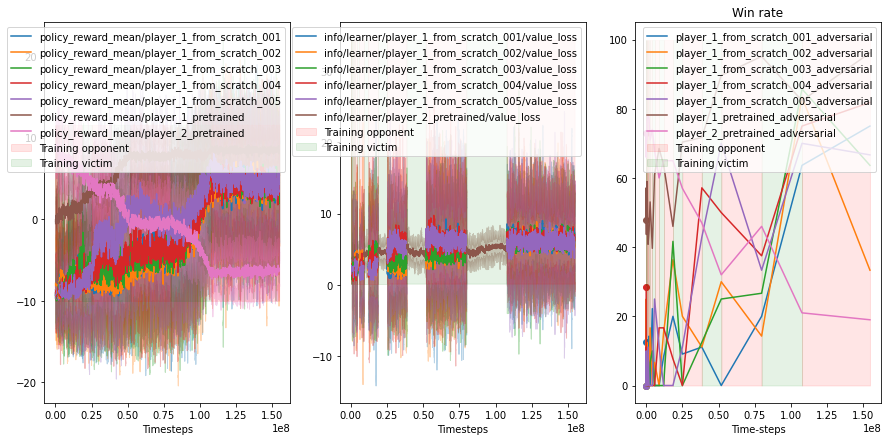

To evaluate 25


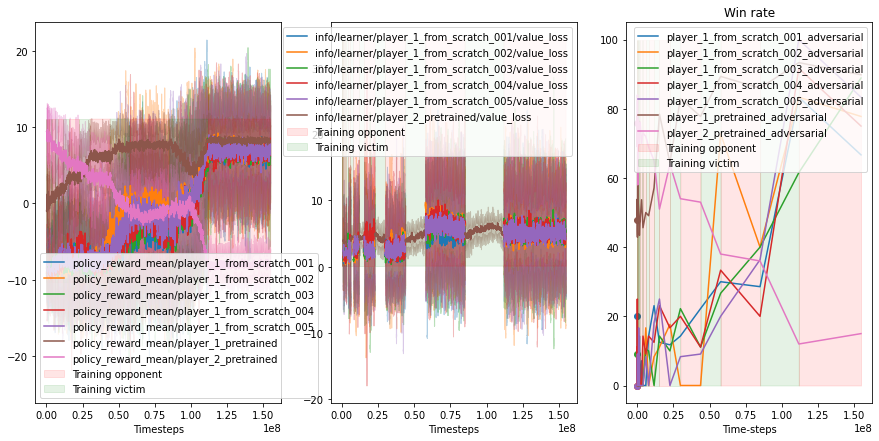

To evaluate 29


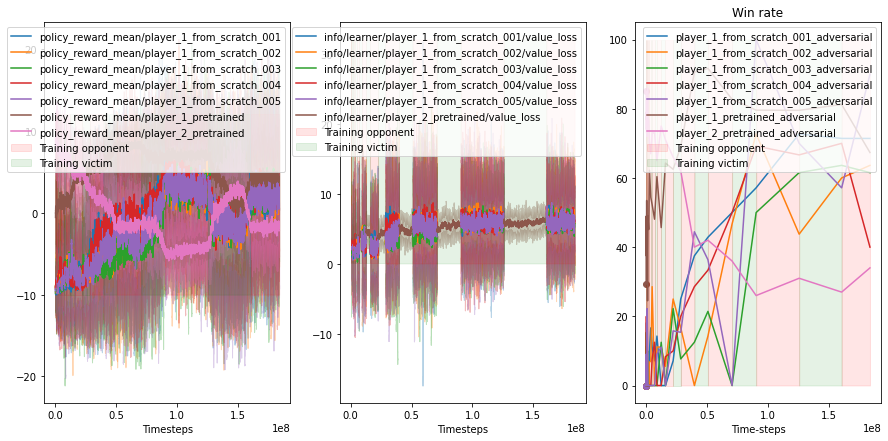

To evaluate 30


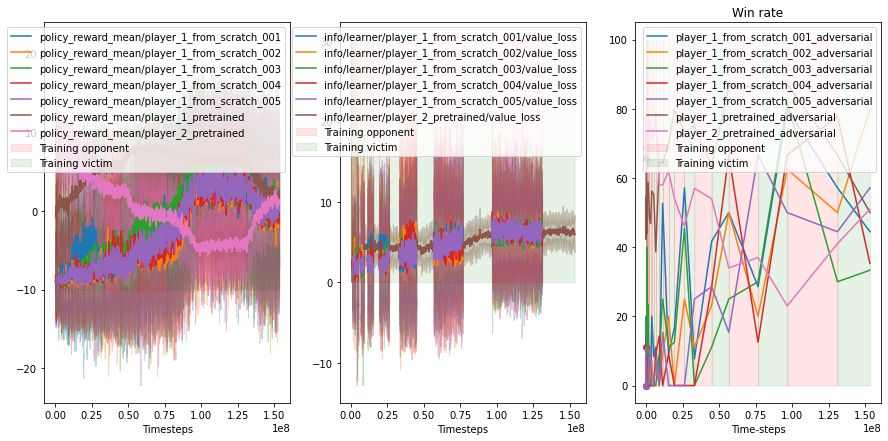

To evaluate 849


/scratch/sergei/miniconda3/envs/adv-tf2/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


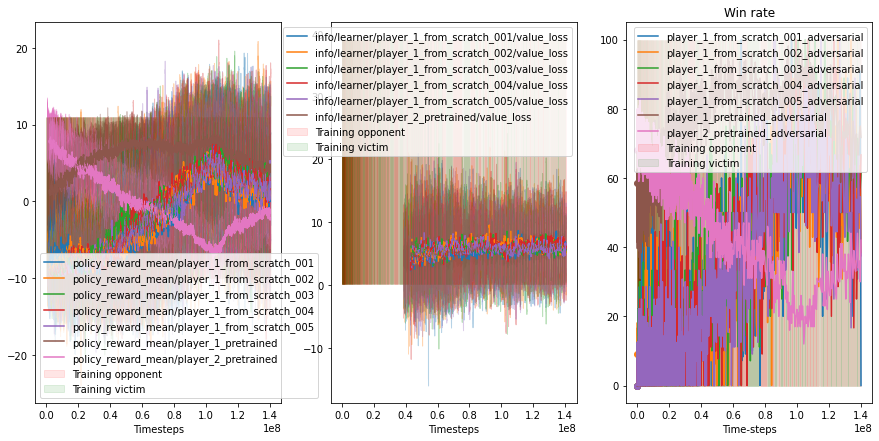

To evaluate 66


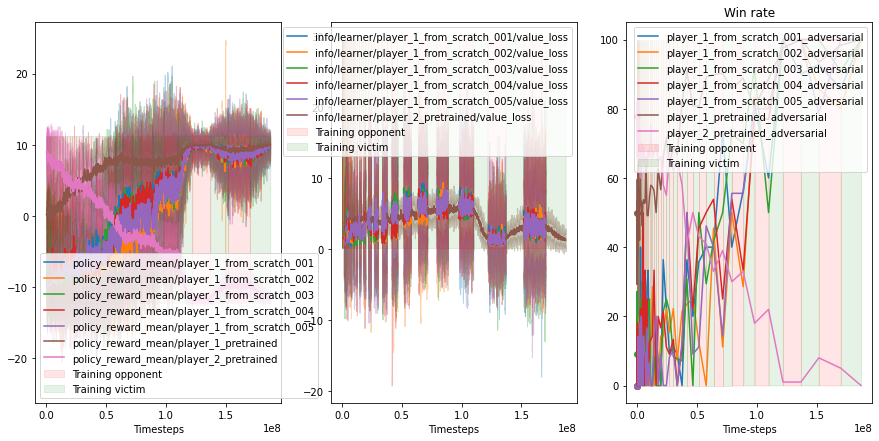

To evaluate 77


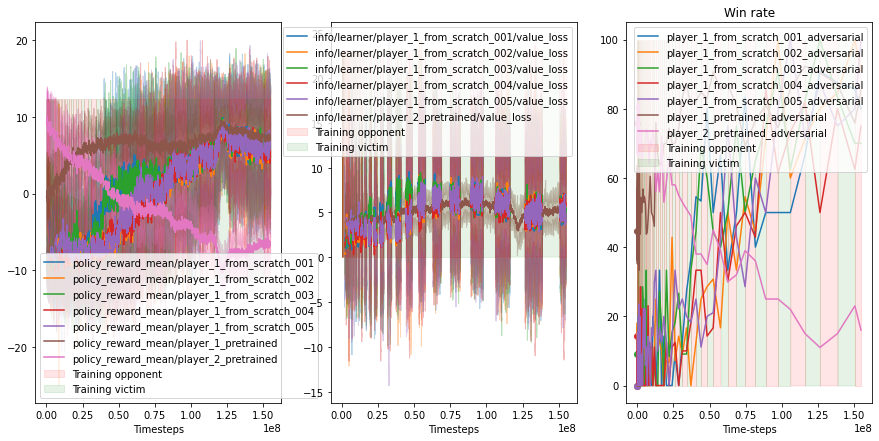

To evaluate 29


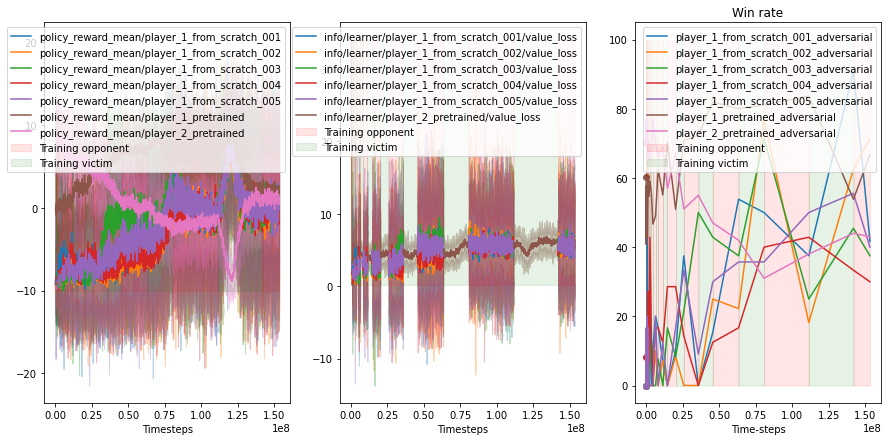

In [43]:
for i, trial in df.iterrows():
    fn = f"{exp_name}_trial_{str(i)}.pkl"
    res = pickle.load(open(fn, "rb"))
    rdf = res['rdf']

    plt.figure(figsize=(15, 7))
    plt.subplot(1, 3, 1)
    plt.xlabel('Timesteps')

    fields = sorted([x for x in rdf.columns if x.startswith(reward_prefix)])

    iterate_bursts(rdf, burst_line_plot, state={'fields': fields,
                                                'colors': {f: cols[i] for i, f in enumerate(fields)},
                                                'rolling': 10},
                   min_size=0)

    plt.legend()
    
    plt.subplot(1, 3, 2)
    plt.xlabel('Timesteps')

    fields = sorted([x for x in rdf.columns if x.endswith('value_loss')])

    iterate_bursts(rdf, burst_line_plot, state={'fields': fields,
                                                'colors': {f: cols[i] for i, f in enumerate(fields)},
                                                'rolling': 10},
                   min_size=0)

    plt.legend()
    plt.subplot(1, 3, 3)

    # was there a switch?
    rdf['switch'] = list(np.array(rdf['which_training'].iloc[1:]) != rdf['which_training'].iloc[:-1]) + [True]

    rdf_e = rdf[rdf['switch'] == 1]
    print("To evaluate", len(rdf_e))

    # obtaining the scores


    scores = res['scores']

    POLICIES_SHOW = list(POLICIES)
    if len(POLICIES_SHOW) == 2:
        POLICIES_SHOW = POLICIES_SHOW[0:1]

    # plotting the win rate
    plt.title("Win rate")
    for p in sorted(POLICIES_SHOW):
        plt.plot(rdf_e['timesteps_total'], [x[f"wins_policy_{p}_reward"] for x in scores], label=p + '_adversarial')
        plt.scatter(rdf_e['timesteps_total'][0], [x[f"wins_policy_{p}_reward"] for x in scores][0])
        assert all([x[f"ties_policy_{p}_reward"] == 0 for x in scores])
    plt.xlabel("Time-steps")

    iterate_bursts(rdf, burst_background, state={'min_metric': 0, 'max_metric': 100}, min_size=0)

    plt.legend()
    plt.show()

In [44]:
def get_data(f):
    for i, trial in df.iterrows():
        fn = f"{exp_name}_trial_{str(i)}.pkl"
        res = pickle.load(open(fn, "rb"))
        yield f(res)
        
def get_data_win_rate():
    def f(res):
        return {'exponent': res['rdf']['config/_burst_exponent'][0],
                'win_normal': res['scores'][-1]['wins_policy_player_1_pretrained_reward'],
                'win_adversary': res['scores'][-1]['wins_policy_player_1_from_scratch_001_reward'],
               }
    return pd.DataFrame(list(get_data(f)))

In [45]:
win_df = get_data_win_rate()

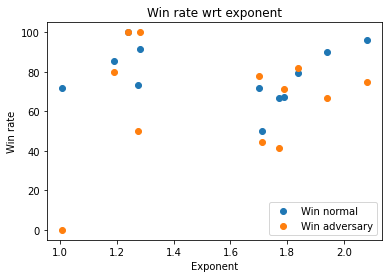

In [46]:
plt.title("Win rate wrt exponent")
plt.scatter(win_df['exponent'], win_df['win_normal'], label='Win normal')
plt.scatter(win_df['exponent'], win_df['win_adversary'], label='Win adversary')
plt.xlabel('Exponent')
plt.ylabel('Win rate')
plt.legend()
plt.show()

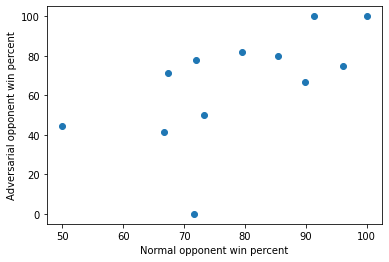

In [47]:
plt.scatter(win_df['win_normal'], win_df['win_adversary'])
plt.xlabel('Normal opponent win percent')
plt.ylabel('Adversarial opponent win percent')
plt.show()